In [1]:
%load_ext autoreload
%autoreload 2

import os, sys
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress TensorFlow info messages

print(sys.version)

import tensorflow as tf
print(tf.__version__)

from src.preprocessing import *
from src.display import *
from src.training import *
from src.plot import plot_training_history

3.10.14 (main, May  6 2024, 19:42:50) [GCC 11.2.0]
2.17.0


In [2]:
print(tf.config.list_physical_devices('GPU'))

[]


I0000 00:00:1729847873.085882   53628 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355


## Preprocessing

In [3]:
train_folder = "data/train"
val_folder = "data/validation"

nii_images_train = list_nii_files(train_folder, 'Flair-Brain.nii')
nii_masks_train = list_nii_files(train_folder, 'LesionSeg-Flair.nii')
nii_images_val = list_nii_files(val_folder, 'Flair-Brain.nii')
nii_masks_val = list_nii_files(val_folder, 'LesionSeg-Flair.nii')


In [4]:
images_train = load_all_data(nii_images_train)
masks_train = load_all_data(nii_masks_train)
images_val = load_all_data(nii_images_val)
masks_val = load_all_data(nii_masks_val)

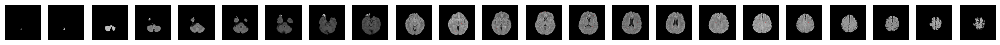

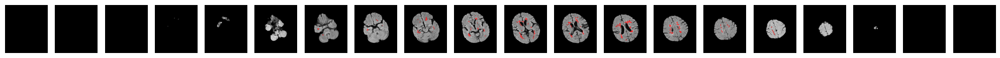

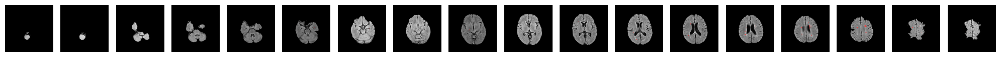

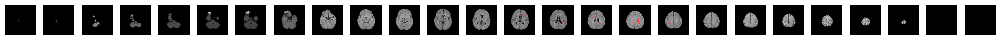

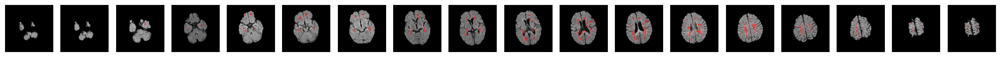

In [5]:
for i, (image, mask) in enumerate(zip(images_train[:5], masks_train[:5])):
    display_image(image, mask, rows=1)

In [6]:
resized_images_train = resize_all_images(images_train)
resized_masks_train = resize_all_images(masks_train)

resized_images_val = resize_all_images(images_val)
resized_masks_val = resize_all_images(masks_val)

# assert that the shapes are the same in mask and scan (x and y dimensions)
# for image, mask in zip(resized_images_train, resized_masks_train):
#     assert image.shape[:-1] == mask.shape[:-1]

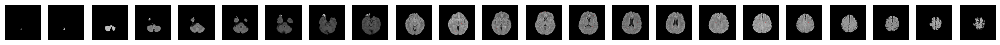

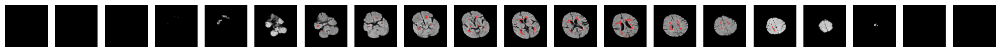

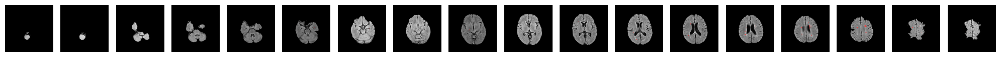

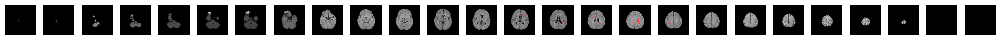

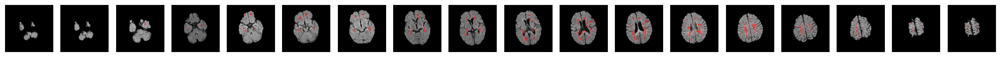

In [7]:
for i, (image, mask) in enumerate(zip(resized_images_train[:5], resized_masks_train[:5])):
    display_image(image, mask, rows=1)

In [8]:
normalized_images_train = normalize_images(resized_images_train)
normalized_images_val = normalize_images(resized_images_val)

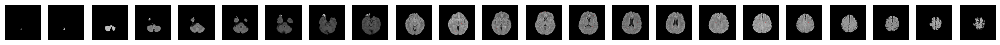

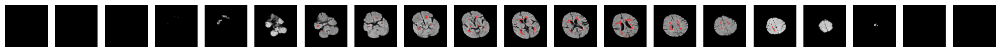

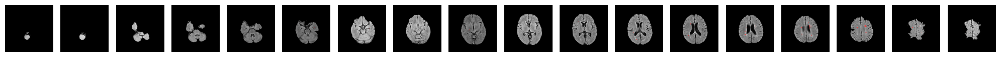

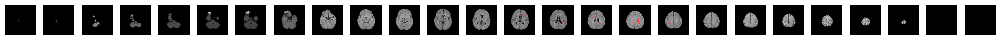

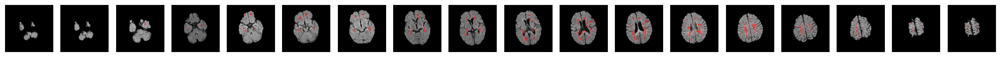

In [9]:
for i, (image, mask) in enumerate(zip(normalized_images_train[:5], resized_masks_train[:5])):
    display_image(image, mask, rows=1)

In [10]:
# Keep only slices that contain lesions
filtered_images_train, filtered_masks_train = filter_slices_with_lesions(normalized_images_train, resized_masks_train)
filtered_images_val, filtered_masks_val = filter_slices_with_lesions(resized_images_val, resized_masks_val)

# Output the number of slices remaining for each scan after filtering
for i, (filtered_image_train, filtered_mask_train) in enumerate(zip(filtered_images_train, filtered_masks_train)):
    print(f"Scan {i + 1}: {filtered_image_train.shape[-1]} slices remaining, corresponding mask shape: {filtered_mask_train.shape}")

Scan 1: 13 slices remaining, corresponding mask shape: (256, 256, 13)
Scan 2: 10 slices remaining, corresponding mask shape: (256, 256, 10)
Scan 3: 12 slices remaining, corresponding mask shape: (256, 256, 12)
Scan 4: 10 slices remaining, corresponding mask shape: (256, 256, 10)
Scan 5: 16 slices remaining, corresponding mask shape: (256, 256, 16)
Scan 6: 12 slices remaining, corresponding mask shape: (256, 256, 12)
Scan 7: 7 slices remaining, corresponding mask shape: (256, 256, 7)
Scan 8: 13 slices remaining, corresponding mask shape: (256, 256, 13)
Scan 9: 4 slices remaining, corresponding mask shape: (256, 256, 4)
Scan 10: 13 slices remaining, corresponding mask shape: (256, 256, 13)
Scan 11: 14 slices remaining, corresponding mask shape: (256, 256, 14)
Scan 12: 7 slices remaining, corresponding mask shape: (256, 256, 7)
Scan 13: 19 slices remaining, corresponding mask shape: (256, 256, 19)
Scan 14: 13 slices remaining, corresponding mask shape: (256, 256, 13)
Scan 15: 12 slices re

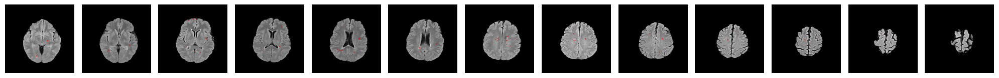

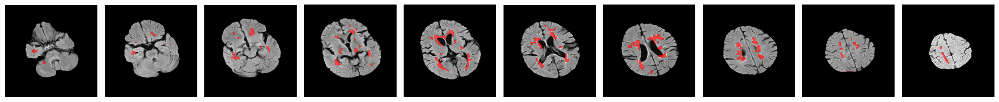

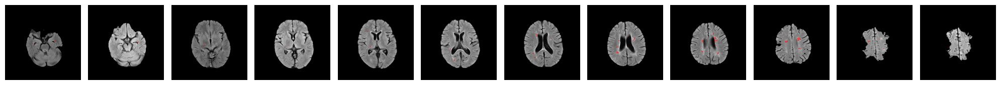

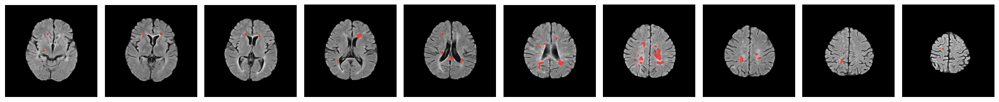

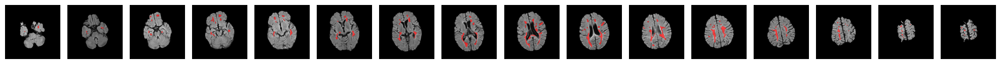

In [11]:
for i, (image, mask) in enumerate(zip(filtered_images_train[:5], filtered_masks_train[:5])):
    display_image(image, mask, rows=1)

In [12]:
# Stack 2D slices from all images
all_slices_train = stack_slices(filtered_images_train)
all_masks_train = stack_slices(filtered_masks_train)
all_slices_val = stack_slices(filtered_images_val)
all_masks_val = stack_slices(filtered_masks_val)

## Data Augmentation 

In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

SEED = 1 # Seed to ensure the same augmentation is applied to both image and mask
BATCH_SIZE = 32

# Flow from memory
slice_iterator_train = get_augment_data_generator(False).flow(all_slices_train, seed=SEED, batch_size=BATCH_SIZE)
mask_iterator_train = get_augment_data_generator(True).flow(all_masks_train, seed=SEED, batch_size=BATCH_SIZE)

# Combined generator
iterator_train = get_combined_iterator(slice_iterator_train, mask_iterator_train)

# We probably don't want to augment the validation data?
slice_iterator_val = ImageDataGenerator().flow(all_slices_val, seed=SEED, batch_size=BATCH_SIZE)
mask_iterator_val = ImageDataGenerator().flow(all_masks_val, seed=SEED, batch_size=BATCH_SIZE)

iterator_val = get_combined_iterator(slice_iterator_val, mask_iterator_val)

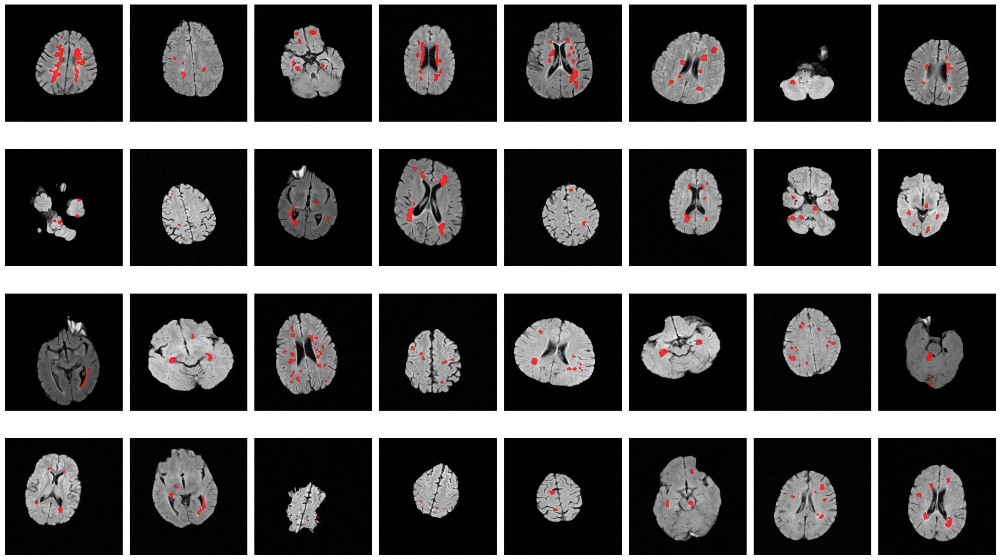

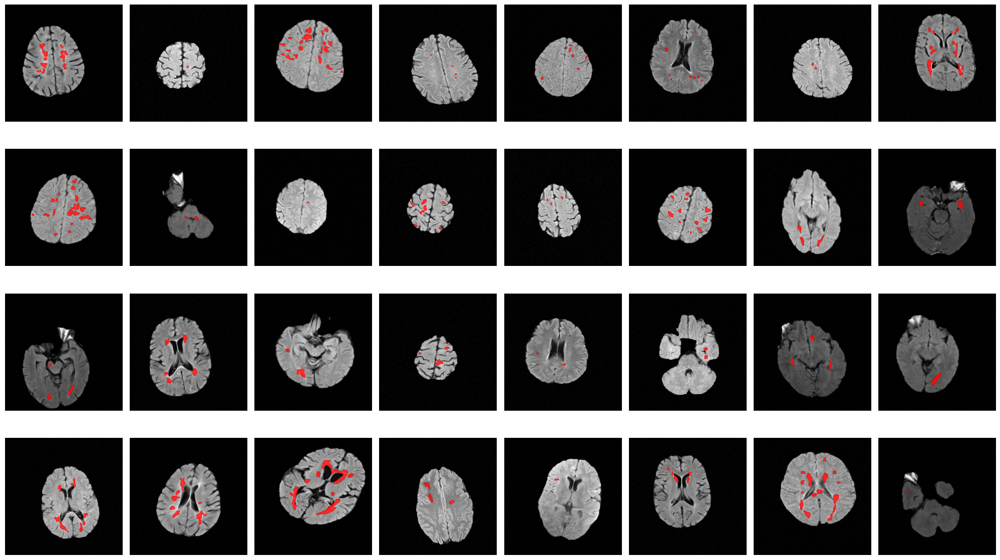

In [14]:
# Display augmented batches to check mask alignment
for n_batch in range(2):
    batch_slices, batch_masks = next(iterator_train)
    display_slices(batch_slices, batch_masks, alpha=0.8, rows=4)

## Model Training

In [15]:
import tensorflow as tf

tf.get_logger().setLevel('WARNING') # Suppress TensorFlow info messages

# Create and compile the model
model = build_unet_resnet50(input_shape=(256, 256, 1))
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 256, 256,  │          0 │ input_layer[0][0… │
│ (Concatenate)       │ 3)                │            │ input_layer[0][0… │
│                     │                   │            │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional          │ [(None, 128, 128, │ 23,587,712 │ concatenate[0][0] │
│ (Functional)        │ 64), (None, 64,   │            │                   │
│                     │ 64, 256), (None,  │            │                   │
│                     │ 32, 32, 512),     │            │                   │
│                     │ (None, 16, 16,    │            │                   │
│                     │ 1024), (None, 8,  │            │                   │
│                     │ 8, 2048)]         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 16, 16,    │          0 │ functional[0][4]  │
│ (UpSampling2D)      │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 16, 16,    │          0 │ up_sampling2d[0]… │
│ (Concatenate)       │ 3072)             │            │ functional[0][3]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 16, 16,    │ 14,156,288 │ concatenate_1[0]… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 16, 16,    │  2,359,808 │ conv2d[0][0]      │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 16, 16,    │          0 │ conv2d_1[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 32, 32,    │          0 │ dropout[0][0]     │
│ (UpSampling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 32, 32,    │          0 │ up_sampling2d_1[… │
│ (Concatenate)       │ 1024)             │            │ functional[0][2]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 32, 32,    │  2,359,552 │ concatenate_2[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 32, 32,    │    590,080 │ conv2d_2[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_2     │ (None, 64, 64,    │          0 │ dropout_1[0][0]   │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 64, 64,    │          0 │ up_sampling2d_2[

 Total params: 43,938,625 (167.61 MB)

 Trainable params: 43,885,505 (167.41 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [16]:
# Train model
steps_per_epoch = len(all_slices_train) // BATCH_SIZE
validation_steps = len(all_slices_val) // BATCH_SIZE

In [16]:
# Train model
model, history = train_model(model, iterator_train, iterator_val, 50, steps_per_epoch, validation_steps)

Epoch 1/50


/home/aimfeld/miniconda3/envs/hslu-vision/lib/python3.10/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_2']. Received: the structure of inputs=*
  warnings.warn(


15/15 ━━━━━━━━━━━━━━━━━━━━ 115s 7s/step - dice_coefficient: 0.0088 - loss: 10.0036 - val_dice_coefficient: 0.0067 - val_loss: 8.9778 - learning_rate: 1.0000e-04
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 96s 6s/step - dice_coefficient: 0.0403 - loss: 8.6847 - val_dice_coefficient: 0.1307 - val_loss: 7.8618 - learning_rate: 9.9902e-05
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 94s 6s/step - dice_coefficient: 0.2662 - loss: 7.5272 - val_dice_coefficient: 0.1531 - val_loss: 7.0470 - learning_rate: 9.9610e-05
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 94s 6s/step - dice_coefficient: 0.4473 - loss: 6.5366 - val_dice_coefficient: 0.4159 - val_loss: 5.9885 - learning_rate: 9.9123e-05
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 95s 6s/step - dice_coefficient: 0.5258 - loss: 5.7335 - val_dice_coefficient: 0.3797 - val_loss: 5.3323 - learning_rate: 9.8445e-05
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 96s 6s/step - dice_coefficient: 0.5456 - loss: 5.0643 - val_dice_coefficient: 0.2763 - val_loss: 4.8220 - learning_rate: 

In [23]:
# Evaluate model
evaluation = model.evaluate(iterator_val, steps=validation_steps)
print(f"Validation Loss: {evaluation[0]}")
print(f"Validation Dice Coefficient: {evaluation[1]}")

4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - dice_coefficient: 0.3678 - loss: 4.2103
Validation Loss: 4.1987104415893555
Validation Dice Coefficient: 0.3942372798919678


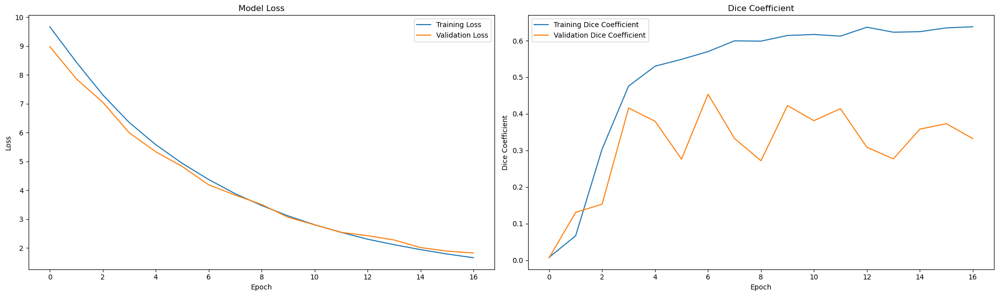

In [26]:
plot_training_history(history)

In [27]:
all_preds = model.predict(all_slices_val)
all_preds_binary = np.where(all_preds > 0.5, 1, 0)

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step


Display the predictions for all validation slices
- Red: Lesion mask (ground truth)
- Blue: Predicted lesion
- Yellow: Overlap

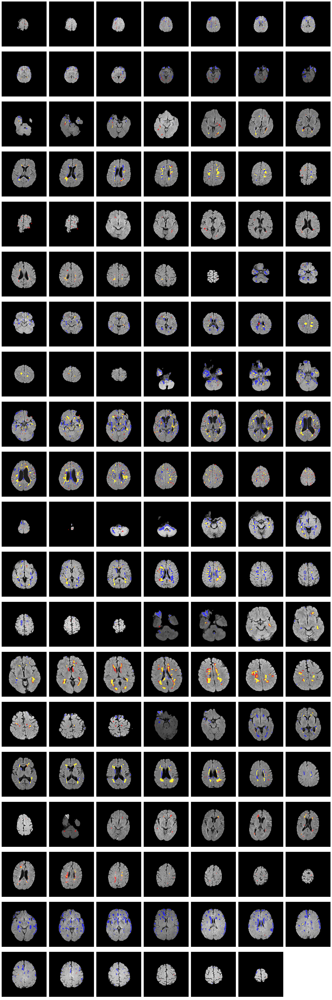

In [28]:
display_slices(all_slices_val, all_masks_val, all_preds_binary, alpha=0.7, rows=20)

## Hyperparameter Tuning

In [ ]:
tuner = hyperparam_tuning(iterator_train, iterator_val, 50, steps_per_epoch, validation_steps)

Trial 6 Complete [00h 03m 45s]
val_dice_coefficient: 0.17166605591773987

Best val_dice_coefficient So Far: 0.36720967292785645
Total elapsed time: 00h 22m 18s

Search: Running Trial #7

Value             |Best Value So Far |Hyperparameter
1.7265e-05        |0.00064737        |learning_rate
0.2               |0                 |dropout_rate
0.0082909         |3.6659e-05        |l2_reg
2                 |2                 |tuner/epochs
0                 |0                 |tuner/initial_epoch
3                 |3                 |tuner/bracket
0                 |0                 |tuner/round

Epoch 1/2
 2/15 ━━━━━━━━━━━━━━━━━━━━ 3:43 17s/step - dice_coefficient: 0.0129 - loss: 9.1392

In [ ]:
# Print a summary of the hyperparameter tuning results
tuner.results_summary()

In [ ]:
# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
best_hps

In [ ]:
# Build the model with the optimal hyperparameters
hp_model = tuner.hypermodel.build(best_hps)

In [ ]:
# Train the model with the optimal hyperparameters
hp_model, hp_history = train_model(hp_model, iterator_train, iterator_val, 50, steps_per_epoch, validation_steps)

In [ ]:
# Evaluate model
evaluation = hp_model.evaluate(iterator_val, steps=validation_steps)
print(f"Validation Loss: {evaluation[0]}")
print(f"Validation Dice Coefficient: {evaluation[1]}")

In [ ]:
plot_training_history(hp_history)

In [ ]:
all_preds = hp_model.predict(all_slices_val)
all_preds_binary = np.where(all_preds > 0.5, 1, 0)
display_slices(all_slices_val, all_masks_val, all_preds_binary, alpha=0.7, rows=20)

In [ ]:
# Load the TensorBoard extension
%load_ext tensorboard

# Start TensorBoard and point it to the 'logs' folder
%tensorboard --logdir logs/